In [1]:
from google.colab import drive
drive.mount('/content/drive')


Mounted at /content/drive


# Imports

In [11]:
!pip install sentence-transformers

In [12]:
import pickle
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sn
from sklearn.metrics.pairwise import cosine_similarity
from sentence_transformers import SentenceTransformer
from sklearn.manifold import TSNE
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from sklearn.metrics import silhouette_score

# Cleaning ignredients and pre processing

# Working with the dataset

In [13]:
#import dataset
data=pd.read_csv('/content/drive/MyDrive/USML Project/L1haveimg.csv')

In [14]:
#load pickle file containing ingredients after pre processing
with open('/content/drive/MyDrive/USML Project/extractNOUNS3max_TF.txt', 'rb') as f:
    data_nouns = pickle.load(f)

In [15]:
#import ingredients vocab
with open('/content/drive/MyDrive/USML Project/vocab_upto3ingr_data2.txt', 'rb') as f:
    vocab = pickle.load(f)

In [16]:
#size of data
print(len(data))

402760


In [17]:
data.head()

,ingredients,url,partition,title,id,instructions
0,"[{'text': '2 12 cups milk'}, {'text': '1 12 cu...",http://www.food.com/recipe/crunchy-onion-potat...,test,Crunchy Onion Potato Bake,00003a70b1,[{'text': 'Preheat oven to 350 degrees Fahrenh...
1,"[{'text': '2 Chicken thighs'}, {'text': '2 tsp...",https://cookpad.com/us/recipes/150100-kombu-te...,train,Kombu Tea Grilled Chicken Thigh,000075604a,[{'text': 'Pierce the skin of the chicken with...
2,"[{'text': '6 -8 cups fresh rhubarb, or'}, {'te...",http://www.food.com/recipe/strawberry-rhubarb-...,train,Strawberry Rhubarb Dump Cake,00007bfd16,[{'text': 'Put ingredients in a buttered 9 x 1...
3,"[{'text': '8 ounces, weight Light Fat Free Van...",http://tastykitchen.com/recipes/breakfastbrunc...,train,Yogurt Parfaits,000095fc1d,[{'text': 'Layer all ingredients in a serving ...
4,"[{'text': '1 teaspoon fennel seeds'}, {'text':...",http://www.epicurious.com/recipes/food/views/f...,train,Fennel-Rubbed Pork Tenderloin with Roasted Fen...,0000b1e2b5,[{'text': 'Preheat oven to 350F with rack in m...


In [18]:
#create dataframe with columns id, dish name, dish ingredients, train/test/val
colnames=["id","name","ingr","partition"]
df=pd.DataFrame(columns=colnames)
df["id"]=data["id"]
df["name"]=data["title"]
df["ingr"]=data_nouns
df["partition"]=data["partition"]

In [19]:
df.head()

,id,name,ingr,partition
0,00003a70b1,Crunchy Onion Potato Bake,"[milk, water, butter, potatoes homestyle, kern...",test
1,000075604a,Kombu Tea Grilled Chicken Thigh,"[chicken thighs, kombu tea, white pepper]",train
2,00007bfd16,Strawberry Rhubarb Dump Cake,"[rhubarb, sugar, water, butter margarine]",train
3,000095fc1d,Yogurt Parfaits,"[strawberries, granola]",train
4,0000b1e2b5,Fennel-Rubbed Pork Tenderloin with Roasted Fen...,"[fennel seeds, pork tenderloin, olive oil, gar...",train


In [190]:
#split dataset
df_train=df.loc[df['partition'] == "train"].reset_index(drop=True)
df_test=df.loc[df['partition'] == "test"].reset_index(drop=True)
df_val=df.loc[df['partition'] == "val"].reset_index(drop=True)

In [191]:
df_train.head()

,id,name,ingr,partition
0,000075604a,Kombu Tea Grilled Chicken Thigh,"[chicken thighs, kombu tea, white pepper]",train
1,00007bfd16,Strawberry Rhubarb Dump Cake,"[rhubarb, sugar, water, butter margarine]",train
2,000095fc1d,Yogurt Parfaits,"[strawberries, granola]",train
3,0000b1e2b5,Fennel-Rubbed Pork Tenderloin with Roasted Fen...,"[fennel seeds, pork tenderloin, olive oil, gar...",train
4,0000c79afb,Pink Sangria,"[bottle wine, brandy, white cranberry juice, o...",train


In [22]:
# train_1000=df_train[0:1000]
# id_list=list(train_1000["id"])
# ing=list(train_1000["ingr"])

# Implementing transformers

In [192]:
#Taking ingredients of 10k train data instances
dataset=df_train[0:10000]
testset=df_test[0:500]
#Taking ingredients of 1k train data instances
# dataset=df_train[0:1000]
ing=list(dataset["ingr"])
len(ing)
testset_ing=list(testset["ingr"])
len(testset_ing)

500

In [113]:
#combining ingredients into a single sentence
sents= []

for i in range(len(ing)):
    sents.append(" ".join(words for words in ing[i]))

testset_sents= []

for i in range(len(testset_ing)):
    testset_sents.append(" ".join(words for words in testset_ing[i]))

In [114]:
len(testset_sents) 

500

In [26]:
#downloading bert model
model_name= "bert-base-nli-mean-tokens"
STmodel=SentenceTransformer(model_name)

Downloading:   0%|          | 0.00/391 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/190 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/3.95k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/2.00 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/625 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/122 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/229 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/438M [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/53.0 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/112 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/466k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/399 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/232k [00:00<?, ?B/s]

In [115]:
#encoding ingredients using the Sentence Transformer model
sentvecs=STmodel.encode(sents)
testset_sentvecs=STmodel.encode(testset_sents)

In [117]:
sentvecs.shape

(10000, 768)

In [118]:
#creating list of ignredient vectors
sentvecs_list=[]

for i in sentvecs:
  sentvecs_list.append(i)

testset_sentvecs_list=[]

for i in testset_sentvecs:
  testset_sentvecs_list.append(i)

In [119]:
#creating dataframe with ingredient vectors
df_vec=pd.DataFrame(columns=["id","ingr","ingr_vecs"])

df_vec["id"]=list(dataset["id"])
df_vec["ingr"]=sents
df_vec["ingr_vecs"]=sentvecs_list


testset_df_vec=pd.DataFrame(columns=["id","ingr","ingr_vecs"])

testset_df_vec["id"]=list(testset["id"])
testset_df_vec["ingr"]=testset_sents
testset_df_vec["ingr_vecs"]=testset_sentvecs_list




In [120]:
df_vec.head()

,id,ingr,ingr_vecs
0,000075604a,chicken thighs kombu tea white pepper,"[-0.5902198, 0.61104864, -1.0107076, -0.186584..."
1,00007bfd16,rhubarb sugar water butter margarine,"[-0.83406085, 1.0246335, 0.18404359, 0.1103328..."
2,000095fc1d,strawberries granola,"[-1.2234862, 0.24232155, 0.19346738, 0.0744836..."
3,0000b1e2b5,fennel seeds pork tenderloin olive oil garlic ...,"[-0.22876498, 1.0438008, -1.2959136, -0.099259..."
4,0000c79afb,bottle wine brandy white cranberry juice orang...,"[-0.67316175, 0.9091471, -1.2869002, 0.2857266..."


In [121]:
testset_df_vec.head()

,id,ingr,ingr_vecs
0,00003a70b1,milk water butter potatoes homestyle kernel co...,"[-0.77855146, 1.3850064, -0.92210054, -0.30516..."
1,00047059be,butternut onion dice oil apple dice chicken br...,"[-0.70110345, 1.413178, -1.6100401, -0.0452717..."
2,00059477e2,package spinach breadcrumbs onion eggs romano ...,"[-0.80590177, 1.6015935, -1.0051347, -0.395919..."
3,000731b459,cauliflower florets safeway butter onion king ...,"[-0.7019239, 1.6200522, -0.745228, -0.33763584..."
4,0007a28fe7,ground beef bacon onion ketchup salt sugar mus...,"[-0.34733242, 1.4479299, -1.0288172, -0.339390..."


Creating Cuisines to find cuisine specific dishes

In [122]:
#common ingredients in cuisines
Indian = ["garam masala","turmeric","cumin seed","green chilies","tamarind","curry leaves","coriander","fenugreek","bay leaves","paneer","ghee","basmati rice"]
Greek = ["feta cheese","oregano","phyllo dough","greek yogurt","walnuts","fava beans","sardines","anchovies"]
Chinese = ["hoisin sauce","oyster sauce","sesame oil","corn starch","peanut oil","soy sauce","white rice vinegar","mushrooms","sichuan","chilli bean sauce"]
Italian = ["parmesan","basil","olive oil","black pepper","pasta","wine","cherry tomato","oregano","balsamic vineger","garlic","capers"]
Japanese = ["sake","mirin","rice vinegar","soy sauce","scallions","miso","wakame","bonito flakes","kombu","shichimi","nori","wasabi"]
Korean = ["gochujang","kimchi","sesame seed oil","sesame seeds","sesame oil","tofu","soy sauce","kochujang","ginger","rice wine","garlic","rice"]
Mexican = ["corn tortillas","salsa","flour tortillas","beans","avocado","pinto beans","cilantro","limes","cheese","tomatos","corn","poblano pepper","chipotles"]
Thai_Vietnamese= ["fish sauce","lemongrass","coconut milk","beansprouts","lime juice","peanuts","shallots","shallot oil","scallions","chiles","thai basil","shrimp paste","jasmine rice","rice vermicelli"]

In [123]:
cuisines=[Indian,Greek,Chinese,Italian,Japanese,Korean,Mexican,Thai_Vietnamese]
cuis_labels=["Indian","Greek","Chinese","Italian","Japanese","Korean","Mexican","Thai/Vietnamese","Other"]

In [124]:
#checking if cuisine specific ingredients in our vocab
for c in cuisines:
  for i in c:
    if i not in vocab:
      print(f"{i}:\t false")

In [125]:
#combining ingredients into a single sentence
cuis_sents= []

for i in range(len(cuisines)):
  cuis_sents.append(" ".join(words for words in cuisines[i]))
# print(cuis_sents)

In [126]:
#encoding cuisine specific ingredients using Sentence Transformers
cuisvecs = STmodel.encode(cuis_sents)

In [127]:
cuisvecs.shape

(8, 768)

Finding cosine similarity between dish ingredients and cuisines

In [128]:
#finding similarity between dishes and cuisine
cuis_sims=[]
labels=[]

for i in range(len(sentvecs)):
  cosine_list=list(cosine_similarity([sentvecs[i]],cuisvecs)[0])
  sim=max(cosine_list)
  # print(sim)
  cuis_sims.append(max(cosine_list))
  if sim>=0.75:
    labels.append(cuis_labels[cosine_list.index(max(cosine_list))])
  else:
    labels.append("Other")




testset_cuis_sims=[]
testset_labels=[]

for i in range(len(testset_sentvecs)):
  testset_cosine_list=list(cosine_similarity([testset_sentvecs[i]],cuisvecs)[0])
  testset_sim=max(testset_cosine_list)
  # print(sim)
  testset_cuis_sims.append(max(testset_cosine_list))
  if sim>=0.75:
    testset_labels.append(cuis_labels[testset_cosine_list.index(max(testset_cosine_list))])
  else:
    testset_labels.append("Other")
  

In [134]:
df_vec["cuisine similarity"]=cuis_sims
df_vec["cuisine"]=labels

In [135]:
testset_df_vec["cuisine similarity"]=testset_cuis_sims
testset_df_vec["cuisine"]=testset_labels

In [137]:
for i in cuis_labels:
  print(f"{i}-------------")
  print("Train")
  print(len(df_vec.loc[df_vec["cuisine"]==i]))
  print("Test")
  print(len(testset_df_vec.loc[testset_df_vec["cuisine"]==i]))


Indian-------------
Train
364
Test
13
Greek-------------
Train
3219
Test
199
Chinese-------------
Train
1605
Test
78
Italian-------------
Train
826
Test
43
Japanese-------------
Train
305
Test
28
Korean-------------
Train
191
Test
15
Mexican-------------
Train
1351
Test
71
Thai/Vietnamese-------------
Train
988
Test
53
Other-------------
Train
1151
Test
0


In [138]:
df_vec["cuisine similarity"].mean()

0.8330714106559753

In [139]:
df_vec["cuisine similarity"].max()

0.9560801982879639

In [140]:
df_vec["cuisine similarity"].min()

0.01137740258127451

In [141]:
testset_df_vec["cuisine similarity"].mean()

0.8345469832420349

# T-SNE Hyperparameter tuning

In [170]:
def trainTSNE(per,iters,vecs,labs):
  TSNEmodel = TSNE(n_components=2, random_state=0, perplexity=per, n_iter=iters)
  tsne_data = TSNEmodel.fit_transform(vecs)

  tsnedata_stacked=np.vstack((tsne_data.T, labs)).T
  tsne_df=pd.DataFrame(data=tsnedata_stacked, columns=["dim1","dim2","label"])
  csvname="data10k_per"+str(per)+"_iter"+str(iters)
  tsne_df.to_csv(csvname+".csv")

  #Define values of x,y
  X = tsne_data.T[0]
  Y = tsne_data.T[1]

  fig = plt.gcf()
  #Set size of plot
  fig.set_size_inches(24, 12)
  #Plotting
  sn.scatterplot( x=X, y=Y, data=tsne_df, hue=tsne_df.label.tolist(),
                  palette=sn.color_palette("Set2",9), alpha=0.7)
  imgname="data10k_per"+str(per)+"_iter"+str(iters)
  # Move the legend to an empty part of the plot
  plt.legend(loc='lower right')
  plt.savefig(imgname,bbox_inches='tight')
  print(imgname)
  plt.show()



/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,


data10k_per20_iter10000


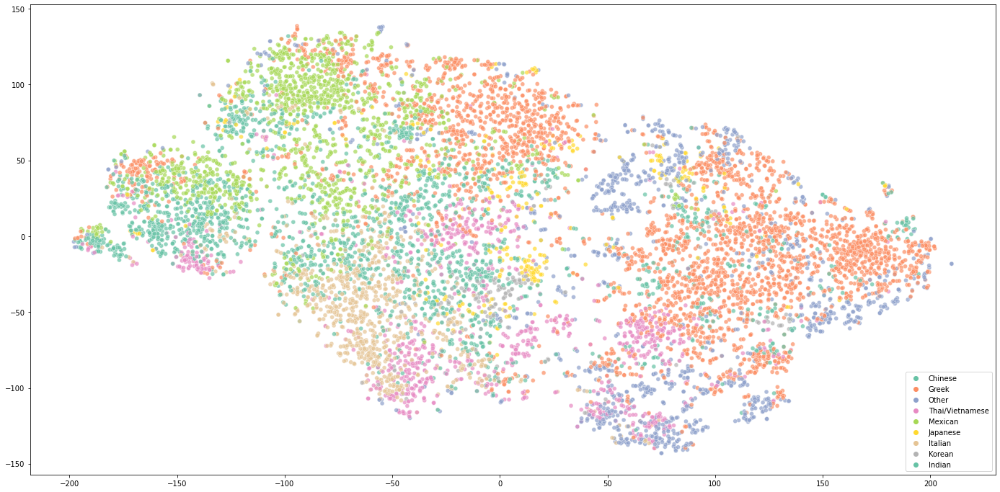

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,


data10k_per30_iter10000


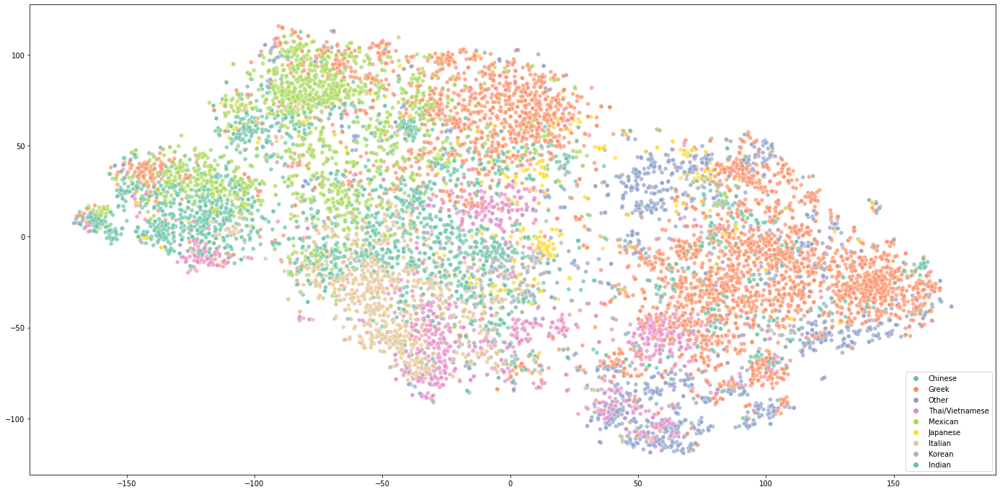

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,


In [ ]:
perplexity=[20,30,50]
# iterations=[2000,3000,5000]
iterations=[10000]

for p in perplexity:
  for i in iterations:
    trainTSNE(p,i,sentvecs,labels)

# Kmeans

In [142]:
PCAmodel = PCA(n_components = 2)
#train
X_principal = PCAmodel.fit_transform(sentvecs)
pca_stacked=np.vstack((X_principal.T, labels)).T
PCA_df = pd.DataFrame(data=pca_stacked,columns = ['P1', 'P2','label'])
PCA_df.head()

,P1,P2,label
0,-3.0796418,0.5071473,Chinese
1,5.296891,-1.0135778,Greek
2,6.236409,2.1070492,Other
3,-5.202198,1.1642765,Thai/Vietnamese
4,6.989554,3.8107972,Other


In [147]:
#test
testset_X_principal = PCAmodel.fit_transform(testset_sentvecs)
testset_pca_stacked=np.vstack((testset_X_principal.T, testset_labels)).T
testset_PCA_df = pd.DataFrame(data=testset_pca_stacked,columns = ['P1', 'P2','label'])
testset_PCA_df.head()

X_test=testset_X_principal[0].T
Y_test=testset_X_principal[1].T


In [72]:
kmeans_kwargs = {"init": "random","n_init": 10,"max_iter": 300,"random_state": 42}
# A list holds the SSE values for each k
sse = []
for k in range(1, 11):
  kmeans = KMeans(n_clusters=k, **kmeans_kwargs)
  kmeans.fit(sentvecs)
  sse.append(kmeans.inertia_)

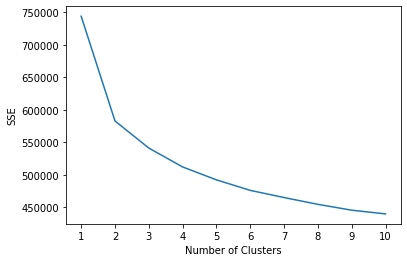

In [73]:
# plt.style.use("fivethirtyeight")
plt.plot(range(1, 11), sse)
plt.xticks(range(1, 11))
plt.xlabel("Number of Clusters")
plt.ylabel("SSE")
plt.show()

In [100]:
def kmeans_func(k,data):
  Kmodel = KMeans(n_clusters=k)
  Kdata = Kmodel.fit(data)
  kmeans_silhouette = silhouette_score(data, Kdata.labels_)
  return kmeans_silhouette, Kdata.labels_


In [101]:
clusters=[2,3,4,5]
klabels=[]
for c in clusters:
  # print(c)
  # print(X_principal)
  sil_score, labs=kmeans_func(c,X_principal)
  klabels.append(labs)
  print(f"No. of Clusters:\t{c}\nSilhouette Score:\t{sil_score}")

No. of Clusters:	2
Silhouette Score:	0.5054574012756348
No. of Clusters:	3
Silhouette Score:	0.4580199718475342
No. of Clusters:	4
Silhouette Score:	0.4145665466785431
No. of Clusters:	5
Silhouette Score:	0.3978412449359894


## Plotting

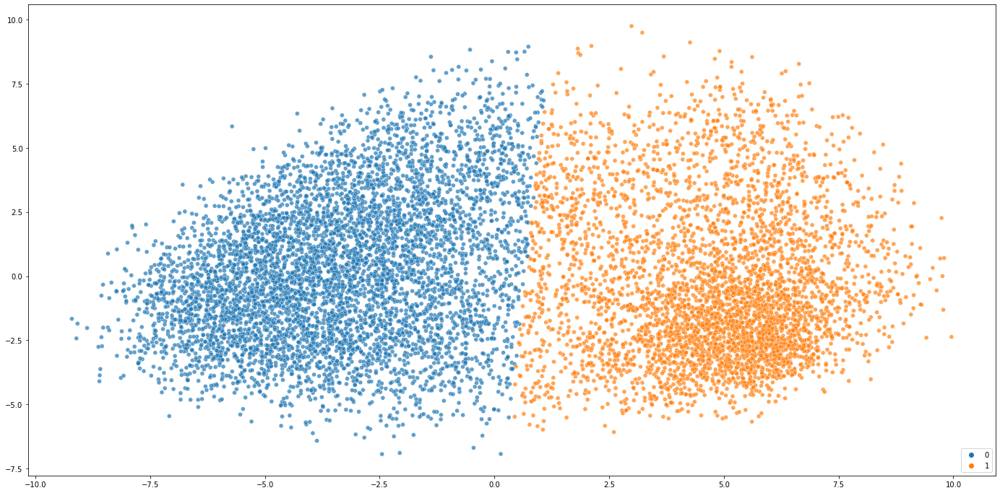

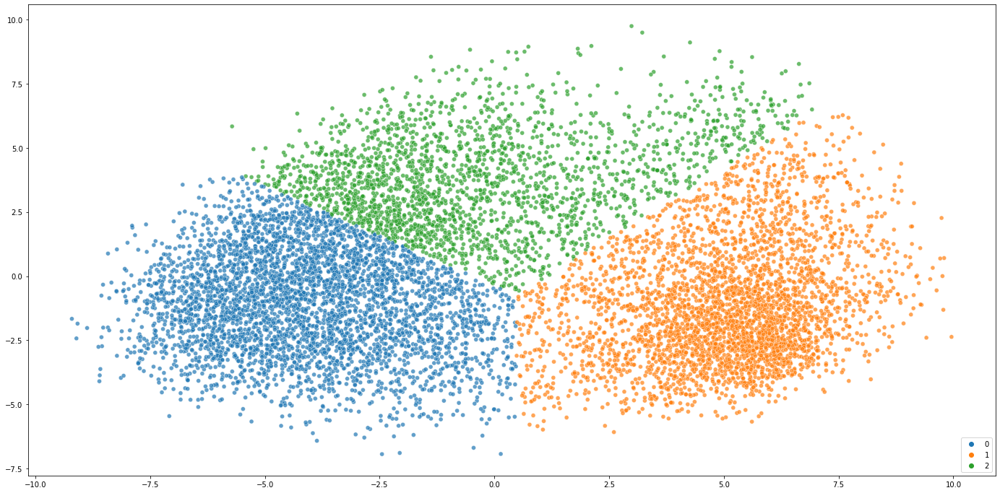

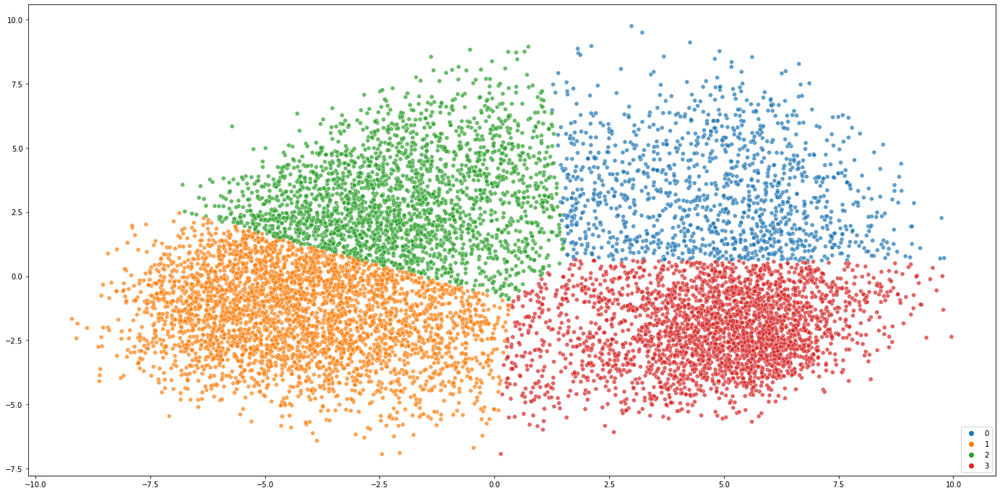

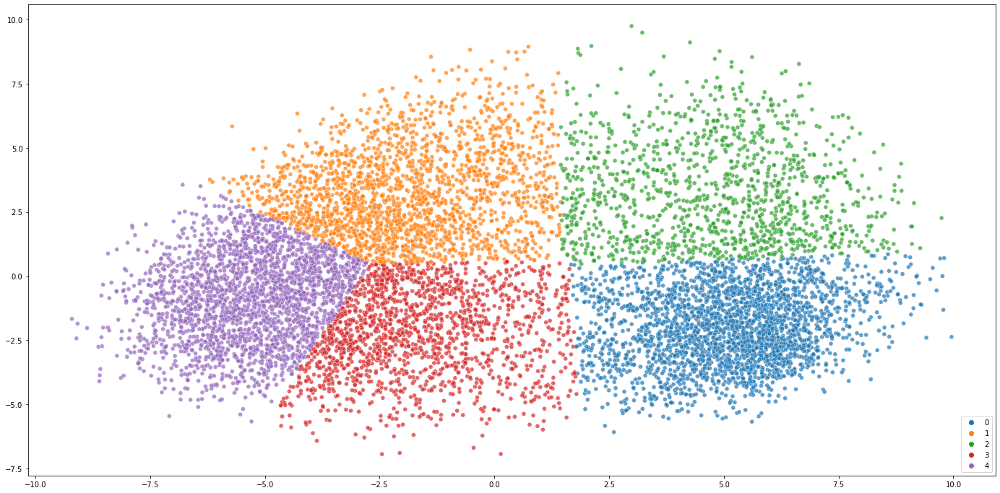

In [107]:
for ind,l in enumerate(klabels):
  #Define values of x,y
  X=X_principal.T[0]
  Y=X_principal.T[1]
  fig = plt.gcf()
  #Set size of plot
  fig.set_size_inches(24, 12)
  #Plotting
  sn.scatterplot( x=X, y=Y, hue=l, palette=sn.color_palette("tab10",ind+2), alpha=0.7)
  # Move the legend to an empty part of the plot
  plt.legend(loc='lower right')
  imgname="kmean"+str(ind+2)+"clusters.jpg"
  plt.savefig(imgname,bbox_inches='tight')
  plt.show()


## K means with 9 clusters

In [305]:
Kmodel = KMeans(n_clusters=9)
Kdata = Kmodel.fit(X_principal)

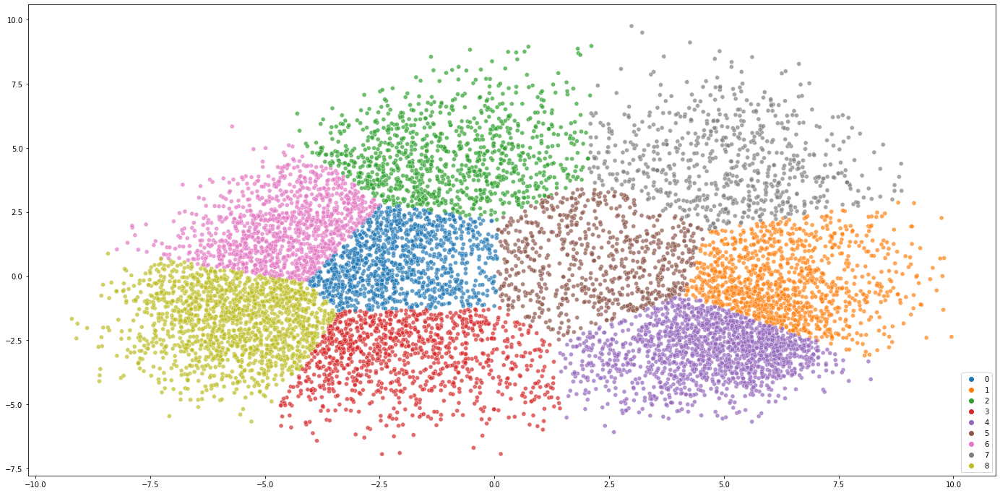

In [306]:
#Define values of x,y
X=X_principal.T[0]
Y=X_principal.T[1]

fig = plt.gcf()
#Set size of plot
fig.set_size_inches(24, 12)
#Plotting
sn.scatterplot( x=X, y=Y, hue=Kdata.labels_, palette=sn.color_palette("tab10",9), alpha=0.7)
# Move the legend to an empty part of the plot
plt.legend(loc='lower right')
imgname="kmean9clusters.jpg"
plt.savefig(imgname,bbox_inches='tight')
plt.show()

In [307]:
pred=Kdata.predict(testset_X_principal)

In [308]:
predictions=list(pred)
# predictions

In [309]:
train_preds=list(Kdata.labels_)

In [310]:
#redefining dataframes
train=dataset
train_vec=df_vec
test=testset
test_vec=testset_df_vec

In [311]:
test["cuisine similarity"]=test_vec["cuisine similarity"]
test["cuisine"]=test_vec["cuisine"]
test["predicted"]=predictions

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documen

In [312]:
train["cuisine similarity"]=train_vec["cuisine similarity"]
train["cuisine"]=train_vec["cuisine"]
train["predicted"]=train_preds

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documen

In [313]:
train.head()

,id,name,ingr,partition,cuisine similarity,cuisine,predicted
0,000075604a,Kombu Tea Grilled Chicken Thigh,"[chicken thighs, kombu tea, white pepper]",train,0.863718,Chinese,0
1,00007bfd16,Strawberry Rhubarb Dump Cake,"[rhubarb, sugar, water, butter margarine]",train,0.793611,Greek,1
2,000095fc1d,Yogurt Parfaits,"[strawberries, granola]",train,0.694631,Other,1
3,0000b1e2b5,Fennel-Rubbed Pork Tenderloin with Roasted Fen...,"[fennel seeds, pork tenderloin, olive oil, gar...",train,0.858843,Thai/Vietnamese,6
4,0000c79afb,Pink Sangria,"[bottle wine, brandy, white cranberry juice, o...",train,0.732999,Other,7


In [314]:
find_c=test["predicted"]
results_9=[]

for ind,i in enumerate(find_c):
  cluster = train.loc[train["predicted"]==find_c[ind]]
  rec = cluster.sort_values('cuisine similarity').tail()
  rec_dict={}
  for i in range(0,5):
    key=str(rec["name"].iloc[i])
    val=str(rec["ingr"].iloc[i])
    # print(key)
    rec_dict[key]=val
  results_9.append([str(test["name"].iloc[ind]),rec_dict])


Recommendations

In [315]:
for i in results_9:
  print(f"Given item:\t{i[0]}")
  print(f"Recommended items and their ingredients:\n{i[1]}\n")
  

Given item:	Crunchy Onion Potato Bake
Recommended items and their ingredients:
{'5-layer Mexican Dip': "['beans', 'powder', 'ground cumin', 'cream breakstone knudsons', 'cheese kraft cheddar', 'tomatoes', 'onion', 'olives', 'tortilla chips']", 'Cheesy Black Bean Quesadillas': "['beans', 'salsa', 'flour tortillas wheat', 'canola oil', 'avocados']", 'Jalapeno-Bacon Macaroni and Cheese': "['bacon', 'jalapeno peppers', 'macaroni rotini pasta', 'butter', 'flour', 'milk', 'cream', 'cheese choice', 'nutmeg', 'salt']", 'I Hate Feta Bean Dip': "['oil', 'cooking vinegar', 'sugar', 'onions', 'beans', 'size corn', 'corn', 'tomato', 'weight feta cheese', 'tortilla chips']", 'Hot Dog Roll-Ups': "['beans', 'chiles', 'powder', 'ground cumin', 'corn tortillas', 'kraft singles half', 'jar salsa', 'breakstone cream', 'onions']"}

Given item:	Butternut Squash Soup or Bisque (Roasting Method)
Recommended items and their ingredients:
{'5-layer Mexican Dip': "['beans', 'powder', 'ground cumin', 'cream breaks

## K means with 3 clusters

In [316]:
Kmodel = KMeans(n_clusters=3)
Kdata = Kmodel.fit(X_principal)

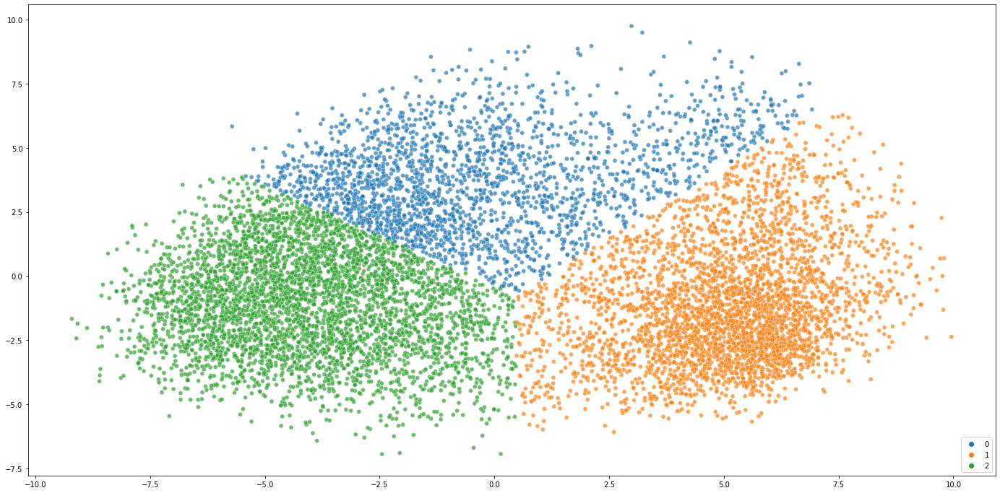

In [317]:
#Define values of x,y
X=X_principal.T[0]
Y=X_principal.T[1]

fig = plt.gcf()
#Set size of plot
fig.set_size_inches(24, 12)
#Plotting
sn.scatterplot( x=X, y=Y, hue=Kdata.labels_, palette=sn.color_palette("tab10",3), alpha=0.7)
# Move the legend to an empty part of the plot
plt.legend(loc='lower right')
imgname="kmean3clusters.jpg"
plt.savefig(imgname,bbox_inches='tight')
plt.show()

In [318]:
pred=Kdata.predict(testset_X_principal)

In [319]:
predictions=list(pred)
# predictions

In [320]:
train_preds=list(Kdata.labels_)

In [321]:
#redefining dataframes
train=dataset
train_vec=df_vec
test=testset
test_vec=testset_df_vec

In [322]:
test["cuisine similarity"]=test_vec["cuisine similarity"]
test["cuisine"]=test_vec["cuisine"]
test["predicted"]=predictions

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documen

In [323]:
train["cuisine similarity"]=train_vec["cuisine similarity"]
train["cuisine"]=train_vec["cuisine"]
train["predicted"]=train_preds

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documen

In [324]:
train.head()

,id,name,ingr,partition,cuisine similarity,cuisine,predicted
0,000075604a,Kombu Tea Grilled Chicken Thigh,"[chicken thighs, kombu tea, white pepper]",train,0.863718,Chinese,2
1,00007bfd16,Strawberry Rhubarb Dump Cake,"[rhubarb, sugar, water, butter margarine]",train,0.793611,Greek,1
2,000095fc1d,Yogurt Parfaits,"[strawberries, granola]",train,0.694631,Other,1
3,0000b1e2b5,Fennel-Rubbed Pork Tenderloin with Roasted Fen...,"[fennel seeds, pork tenderloin, olive oil, gar...",train,0.858843,Thai/Vietnamese,2
4,0000c79afb,Pink Sangria,"[bottle wine, brandy, white cranberry juice, o...",train,0.732999,Other,1


In [325]:
find_c=test["predicted"]
results_3=[]

for ind,i in enumerate(find_c):
  cluster = train.loc[train["predicted"]==find_c[ind]]
  rec = cluster.sort_values('cuisine similarity').tail()
  rec_dict={}
  for i in range(0,5):
    key=str(rec["name"].iloc[i])
    val=str(rec["ingr"].iloc[i])
    # print(key)
    rec_dict[key]=val
  results_3.append([str(test["name"].iloc[ind]),rec_dict])


Recommendations

In [326]:
for i in results_3:
  print(f"Given item:\t{i[0]}")
  print(f"Recommended items and their ingredients:\n{i[1]}\n")
  

Given item:	Crunchy Onion Potato Bake
Recommended items and their ingredients:
{"Tami's Szechuan Shrimp": "['shrimp', 'ketchup', 'chili sauce', 'soy sauce', 'honey', 'salt', 'pepper', 'cornstarch', 'mushrooms', 'red pepper', 'onions', 'sesame oil', 'spice']", 'Sticky Asian Wings': "['chicken wings tips', 'ginger', 'salt', 'water', 'chili sauce', 'sugar', 'cider vinegar', 'sodium soy sauce', 'cornstarch', 'sesame seed oil']", 'Mexican Quinoa Casserole': "['tomatoes', 'beans', 'corn', 'jalapeno', 'salsa', 'broth', 'quinoa', 'ground beef', 'taco seasoning', 'water', 'cheddar cheese', 'cream', 'cilantro', 'lime']", 'Zesty quinoa salad & chicken tacos': "['chicken breasts', 'quinoa', 'beans', 'corn', 'avocados', 'limes', 'roma tomato', 'cilantro', 'corn tortillas', 'taco seasoning', 'pepper flakes', 'cumin']", 'Vegetable Nachos (Improved)': "['mozzarella cheese', 'jalapenos', 'oil', 'onion', 'corn use drain', 'garlic', 'beans', 'plum roma tomatoes', 'salsa chunky', 'cilantro', 'tortilla chi

In [149]:
Kmodel = KMeans(n_clusters=9)
Kdata = Kmodel.fit(X_principal)

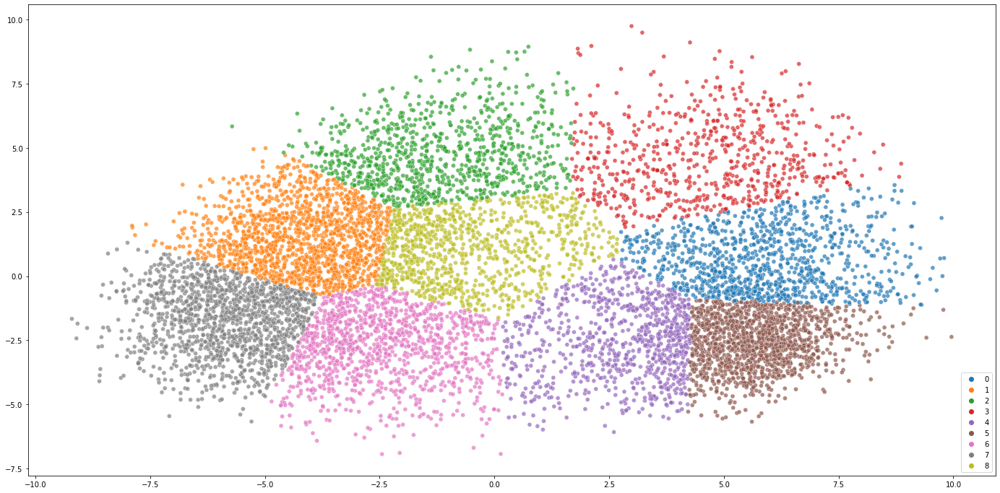

In [150]:
#Define values of x,y
X=X_principal.T[0]
Y=X_principal.T[1]

fig = plt.gcf()
#Set size of plot
fig.set_size_inches(24, 12)
#Plotting
sn.scatterplot( x=X, y=Y, hue=Kdata.labels_, palette=sn.color_palette("tab10",9), alpha=0.7)
# Move the legend to an empty part of the plot
plt.legend(loc='lower right')
imgname="kmean9clusters.jpg"
plt.savefig(imgname,bbox_inches='tight')
plt.show()

In [151]:
pred=Kdata.predict(testset_X_principal)

In [168]:
predictions=list(pred)
# predictions

In [211]:
train_preds=list(Kdata.labels_)

In [199]:
#redefining dataframes
train=dataset
train_vec=df_vec
test=testset
test_vec=testset_df_vec

In [200]:
test["cuisine similarity"]=test_vec["cuisine similarity"]
test["cuisine"]=test_vec["cuisine"]
test["predicted"]=predictions

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


In [212]:
train["cuisine similarity"]=train_vec["cuisine similarity"]
train["cuisine"]=train_vec["cuisine"]
train["predicted"]=train_preds

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documen

In [213]:
train.head()

,id,name,ingr,partition,cuisine similarity,cuisine,predicted
0,000075604a,Kombu Tea Grilled Chicken Thigh,"[chicken thighs, kombu tea, white pepper]",train,0.863718,Chinese,1
1,00007bfd16,Strawberry Rhubarb Dump Cake,"[rhubarb, sugar, water, butter margarine]",train,0.793611,Greek,5
2,000095fc1d,Yogurt Parfaits,"[strawberries, granola]",train,0.694631,Other,0
3,0000b1e2b5,Fennel-Rubbed Pork Tenderloin with Roasted Fen...,"[fennel seeds, pork tenderloin, olive oil, gar...",train,0.858843,Thai/Vietnamese,1
4,0000c79afb,Pink Sangria,"[bottle wine, brandy, white cranberry juice, o...",train,0.732999,Other,3


In [284]:
find_c=test["predicted"]
results=[]

for ind,i in enumerate(find_c):
  cluster = train.loc[train["predicted"]==find_c[ind]]
  rec = cluster.sort_values('cuisine similarity').tail()
  rec_dict={}
  for i in range(0,5):
    key=str(rec["name"].iloc[i])
    val=str(rec["ingr"].iloc[i])
    # print(key)
    rec_dict[key]=val
  results.append([str(test["name"].iloc[ind]),rec_dict])


Recommendations

In [285]:
for i in results:
  print(f"Given item:\t{i[0]}")
  print(f"Recommended items and their ingredients:\n{i[1]}\n")
  

Given item:	Crunchy Onion Potato Bake
Recommended items and their ingredients:
{'Cheesy Black Bean Quesadillas': "['beans', 'salsa', 'flour tortillas wheat', 'canola oil', 'avocados']", 'Jalapeno-Bacon Macaroni and Cheese': "['bacon', 'jalapeno peppers', 'macaroni rotini pasta', 'butter', 'flour', 'milk', 'cream', 'cheese choice', 'nutmeg', 'salt']", 'Ma Po Eggplant in Garlic Sauce': "['ground pork', 'rice vinegar', 'oelek chile sauce', 'cornstarch', 'soy sauce', 'eggplants', 'peanut oil brushing', 'salt', 'sake', 'sugar', 'oil', 'scallions scallions garnish', 'garlic cloves', 'ginger', 'rice']", 'I Hate Feta Bean Dip': "['oil', 'cooking vinegar', 'sugar', 'onions', 'beans', 'size corn', 'corn', 'tomato', 'weight feta cheese', 'tortilla chips']", 'Hot Dog Roll-Ups': "['beans', 'chiles', 'powder', 'ground cumin', 'corn tortillas', 'kraft singles half', 'jar salsa', 'breakstone cream', 'onions']"}

Given item:	Butternut Squash Soup or Bisque (Roasting Method)
Recommended items and their 

# Reference plot from TSNE

Reference Plot: Compare Kmeans clustering to the custom cuisine categories

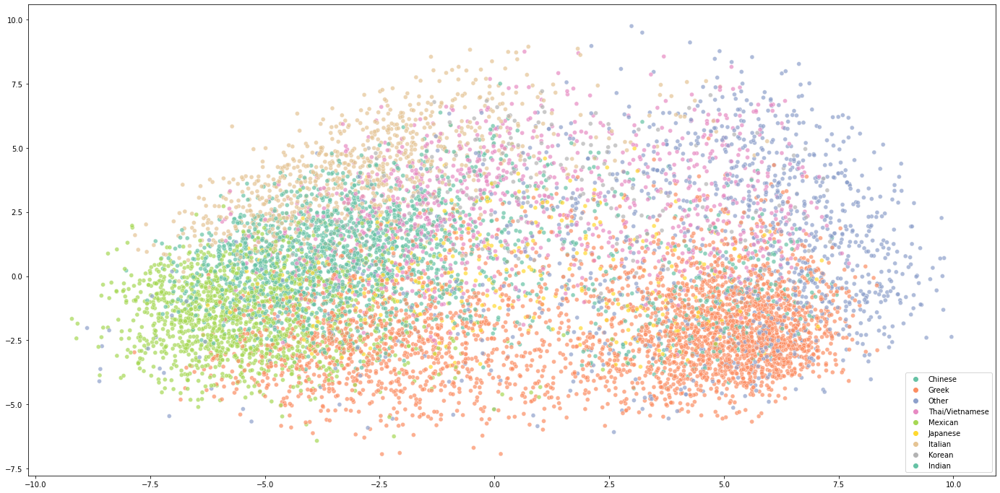

In [74]:
#Define values of x,y
X=X_principal.T[0]
Y=X_principal.T[1]

fig = plt.gcf()
#Set size of plot
fig.set_size_inches(24, 12)
#Plotting
sn.scatterplot( x=X, y=Y, data=PCA_df, hue=PCA_df.label.tolist(),
                palette=sn.color_palette("Set2",9), alpha=0.7)
# Move the legend to an empty part of the plot
plt.legend(loc='lower right')
plt.savefig("Kmeans_ref.jpg",bbox_inches='tight')
plt.show()